In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from tqdm import tqdm
%matplotlib inline
from torch.utils.data import Dataset, DataLoader
import torch
import torchvision

import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


# Generate dataset

In [2]:
y = np.random.randint(0,3,150)
idx= []
for i in range(3):
    print(i,sum(y==i))
    idx.append(y==i)

0 51
1 53
2 46


In [3]:
x = np.zeros((150,2))
# x1 = np.zeros((500,2))

In [4]:
# x[idx[0]] = np.random.uniform(low =-1,high =0,size= sum(idx[0]))
# x[idx[1]] = np.random.uniform(low =0,high =1,size= sum(idx[1]))
# x[idx[2]] = np.random.uniform(low =2,high =3,size= sum(idx[2]))
# x[idx[3],:] = np.random.normal(loc = 3)


In [5]:
x[idx[0],:] = np.random.multivariate_normal(mean =[0.5,8],cov=[[0.1,0],[0,0.1]],size=sum(idx[0]))

x[idx[1],:] = np.random.multivariate_normal(mean = [1,5.5],cov=[[0.1,0],[0,0.1]],size=sum(idx[1]))

x[idx[2],:] = np.random.multivariate_normal(mean = [3.5,7],cov=[[0.1,0],[0,0.1]],size=sum(idx[2]))


In [6]:
# x,y = np.concatenate((x,x1),axis=0),np.concatenate((y,y),axis=0)
x.shape,y.shape

((150, 2), (150,))

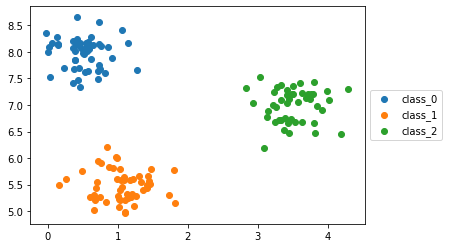

In [7]:
for i in range(3):
    #y= np.zeros(x[idx[i]].shape[0])
    plt.scatter(x[idx[i],0],x[idx[i],1],label="class_"+str(i))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

In [8]:
foreground_classes = {'class_0','class_1'}

background_classes = {'class_2'}

In [9]:
idx

[array([False,  True, False, False, False, False,  True, False, False,
        False,  True,  True, False, False, False, False, False,  True,
         True,  True, False,  True, False,  True, False,  True, False,
        False, False, False, False, False, False,  True, False, False,
        False,  True,  True, False, False,  True,  True, False, False,
         True, False, False, False, False,  True,  True, False, False,
        False, False,  True, False, False, False,  True, False,  True,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False,  True, False,
         True, False, False, False,  True, False,  True, False, False,
        False,  True, False,  True, False,  True,  True, False,  True,
         True, False, False,  True, False, False, False,  True, False,
        False, False, False, False,  True, False, False, False, False,
        False,  True, False, False, False, False,  True,  True, False,
      

In [10]:
fg_class  = np.random.randint(0,2)
fg_idx = np.random.randint(0,3)
bg_class = 2
a = []
for i in range(3):
    if i == fg_idx:
        b = np.random.choice(np.where(idx[fg_class]==True)[0],size=1)
        a.append(x[b])
        print("foreground "+str(fg_class)+" present at " + str(fg_idx))
    else:
        
        b = np.random.choice(np.where(idx[bg_class]==True)[0],size=1)
        a.append(x[b])
        print("background "+str(bg_class)+" present at " + str(i))
a = np.concatenate(a,axis=0)
#print(a.shape)

print(fg_class , fg_idx)

foreground 0 present at 0
background 2 present at 1
background 2 present at 2
0 0


In [11]:
a

array([[0.50182189, 7.98334006],
       [3.80326682, 6.65370783],
       [3.91351683, 6.90727454]])

In [12]:
desired_num = 1000
mosaic_list =[]
mosaic_label = []
fore_idx=[]
for j in range(desired_num):
    fg_class  = np.random.randint(0,2)
    fg_idx = np.random.randint(0,3)
    bg_class = 2
    a = []
    for i in range(3):
        if i == fg_idx:
            b = np.random.choice(np.where(idx[fg_class]==True)[0],size=1)
            a.append(x[b])
#             print("foreground "+str(fg_class)+" present at " + str(fg_idx))
        else:
            
            b = np.random.choice(np.where(idx[bg_class]==True)[0],size=1)
            a.append(x[b])
#             print("background "+str(bg_class)+" present at " + str(i))
    a = np.concatenate(a,axis=0)
    mosaic_list.append(np.reshape(a,(6,1)))
    mosaic_label.append(fg_class)
    fore_idx.append(fg_idx)

In [13]:
mosaic_list = np.concatenate(mosaic_list,axis=1).T
print(mosaic_list)

[[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ]
 [3.30939604 6.71004907 4.19247376 6.45909405 0.1515626  8.12473193]
 [0.65746314 5.0121504  3.42973131 6.6552601  3.24882843 6.68760281]
 ...
 [3.13096924 6.78150985 3.33023618 7.38574061 1.09528572 5.58381162]
 [3.42973131 6.6552601  0.81006708 7.59850528 3.53469576 6.68080768]
 [0.3705194  7.67711915 3.69290313 7.12897456 2.93610316 7.0321443 ]]


In [14]:
print(np.shape(mosaic_label))
print(np.shape(fore_idx))

(1000,)
(1000,)


In [15]:
mosaic_list[:,0:2].shape

(1000, 2)

In [16]:
class MosaicDataset(Dataset):
    """MosaicDataset dataset."""
    
    
    def __init__(self, mosaic_list, mosaic_label, fore_idx):
        """
          Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.mosaic = mosaic_list
        self.label = mosaic_label
        self.fore_idx = fore_idx

    def __len__(self):
        return len(self.label)

    def __getitem__(self, idx):
        return self.mosaic[idx] , self.label[idx], self.fore_idx[idx]

batch = 250
msd = MosaicDataset(mosaic_list, mosaic_label , fore_idx)
train_loader = DataLoader( msd,batch_size= batch ,shuffle=False)

In [17]:
class Wherenet(nn.Module):
    def __init__(self):
        super(Wherenet,self).__init__()
        self.linear1 = nn.Linear(2,1)
    def forward(self,z):
        x = torch.zeros([batch,3],dtype=torch.float64)
        y = torch.zeros([batch,2], dtype=torch.float64)
        #x,y = x.to("cuda"),y.to("cuda")
        for i in range(3):
            x[:,i] = self.helper(z[:,2*i:2*i+2])[:,0]
            #print(k[:,0].shape,x[:,i].shape)
        x = F.softmax(x,dim=1)   # alphas
        #print(x.shape)
        x1 = x[:,0]
        for i in range(3):
            x1 = x[:,i]          
            y = y+torch.mul(x1[:,None],z[:,2*i:2*i+2])
        return y , x 

    
    def helper(self,x):
        x = self.linear1(x)
        #x = F.relu(self.linear2(x))
        #x = self.linear3(x)
        
        return x

    

In [18]:
for i in range(3):
    print(2*i,2*i+2)

0 2
2 4
4 6


In [19]:
trainiter = iter(train_loader)
input1,labels1,index1 = trainiter.next()



In [20]:
where = Wherenet().double()
where = where
out_avg,alphas = where(input1)
# out_avg.shape,alphas.shape

In [21]:
out_avg.shape,alphas.shape

(torch.Size([250, 2]), torch.Size([250, 3]))

In [22]:
class Whatnet(nn.Module):
    def __init__(self):
        super(Whatnet,self).__init__()
        self.linear1 = nn.Linear(2,2)
#         self.linear2 = nn.Linear(8,16)
#         self.linear3 = nn.Linear(16,3)
    def forward(self,x):
        x = self.linear1(x)
#         x = F.relu(self.linear2(x))
#         x = self.linear3(x)
        return x

In [23]:
what =Whatnet().double()
what(out_avg)

tensor([[-5.8812,  2.8582],
        [-5.7525,  2.8145],
        [-4.3758,  2.0731],
        [-4.6679,  2.1592],
        [-4.9483,  2.3691],
        [-5.7411,  2.8446],
        [-5.8851,  2.8765],
        [-5.8798,  2.8616],
        [-5.6339,  2.7502],
        [-5.7246,  2.7753],
        [-4.9826,  2.3014],
        [-5.6432,  2.6950],
        [-4.5818,  2.1296],
        [-4.6797,  2.1894],
        [-5.8266,  2.8148],
        [-6.0496,  2.9471],
        [-5.9021,  2.8601],
        [-6.0740,  2.9271],
        [-5.6660,  2.8206],
        [-5.5824,  2.6848],
        [-4.6786,  2.1822],
        [-5.9223,  2.9194],
        [-4.8454,  2.2301],
        [-4.6281,  2.1379],
        [-4.9171,  2.3505],
        [-5.9525,  2.9408],
        [-5.7887,  2.7976],
        [-4.6822,  2.1916],
        [-5.8877,  2.8957],
        [-5.8760,  2.7855],
        [-5.9567,  2.8743],
        [-4.9922,  2.3091],
        [-5.9557,  2.9578],
        [-4.5852,  2.1434],
        [-4.7291,  2.2620],
        [-5.6677,  2

In [24]:
def disp_plot(data,avg_data,true_label,pred_label,alpha,true_idx):
    plt.figure(figsize=(6,6))
    data = data.numpy()
    alpha = alpha.detach().numpy()
    avg_data = avg_data.detach().numpy()
 
    x = data[:,0:2]
    y = data[:,2:4]
    z = data[:,4:6]
    colors = ['b','g','r','c','m','y','k','teal','indigo','peru']
    
    print(data[0],avg_data[0])
    for i in range(0,10):
        plt.plot([x[i,0],y[i,0]],[x[i,1],y[i,1]],color= colors[i])#,marker ='o-')
        plt.plot([z[i,0],y[i,0]],[z[i,1],y[i,1]],color= colors[i])#,marker ='o-')
        plt.plot([x[i,0],z[i,0]],[x[i,1],z[i,1]],color= colors[i])#,marker ='o-')
#         print("dssda",avg_data[i,0],avg_data[i,1])
#         print("aaaaa",x,y,z)
        plt.plot(avg_data[i,0], avg_data[i,1],marker="x", markersize=12, color= colors[i])
        


[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [1.78671966 7.66924327]
[1,     4] loss: 3.545
[1,    4] accuracy: 0.503
[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [1.85512796 7.64920938]
[2,     4] loss: 1.184
[2,    4] accuracy: 0.515
[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [1.95474909 7.61989818]
[3,     4] loss: 2.070
[3,    4] accuracy: 0.497
[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [1.928912   7.62675576]
[4,     4] loss: 1.070
[4,    4] accuracy: 0.495
[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [1.84092326 7.65167331]
[5,     4] loss: 1.204
[5,    4] accuracy: 0.503
[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [1.79598779 7.66426469]
[6,     4] loss: 0.777
[6,    4] accuracy: 0.515
[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [1.77110412 7.67117769]
[7,     4] loss: 0.914
[7,    4] accuracy: 0.497
[3.33023618 7

/home/dell/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [0.87891283 7.93217361]
[23,     4] loss: 0.435
[23,    4] accuracy: 0.917
[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [0.84899911 7.94089766]
[24,     4] loss: 0.419
[24,    4] accuracy: 0.928
[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [0.82398186 7.94819022]
[25,     4] loss: 0.405
[25,    4] accuracy: 0.941
[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [0.80249454 7.9544502 ]
[26,     4] loss: 0.392
[26,    4] accuracy: 0.935
[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [0.78436881 7.95972952]
[27,     4] loss: 0.379
[27,    4] accuracy: 0.937
[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [0.76935777 7.96410256]
[28,     4] loss: 0.367
[28,    4] accuracy: 0.945
[3.33023618 7.38574061 3.41473609 7.04479474 0.56369019 8.0229604 ] [0.75671361 7.96778719]
[29,     4] loss: 0.356
[29,    4] accuracy: 0.946

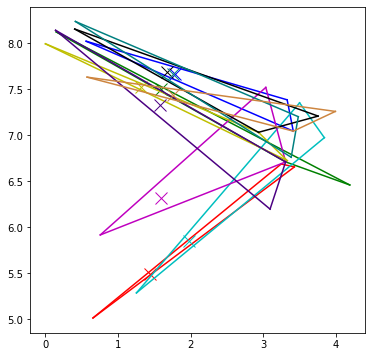

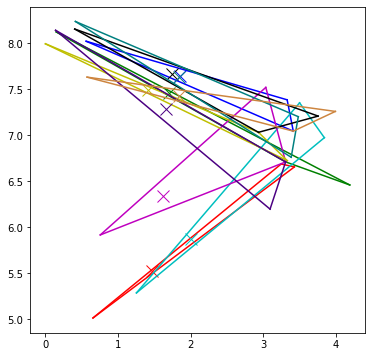

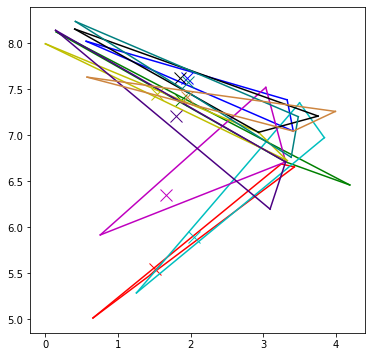

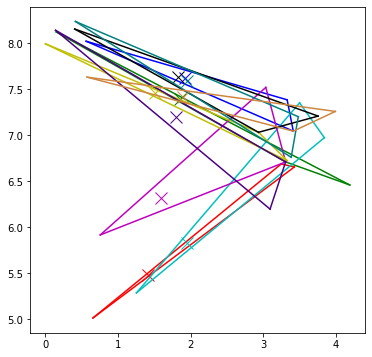

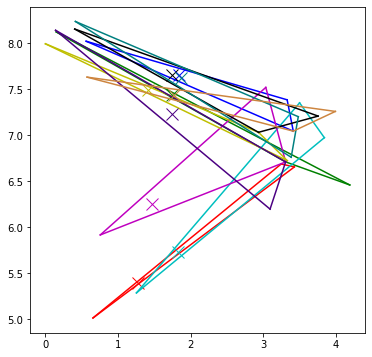

...

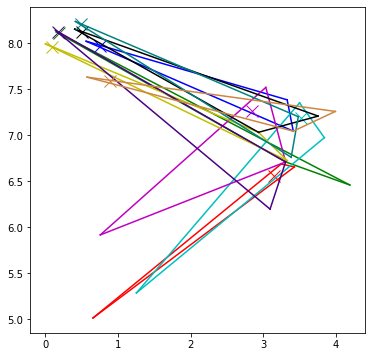

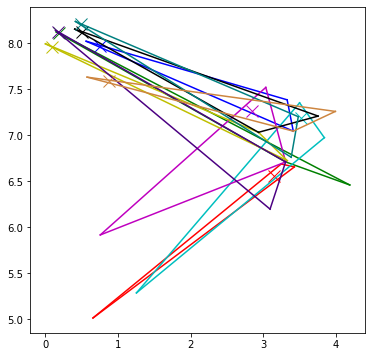

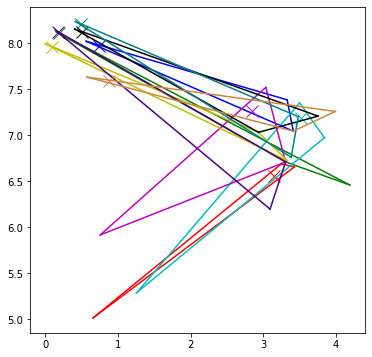

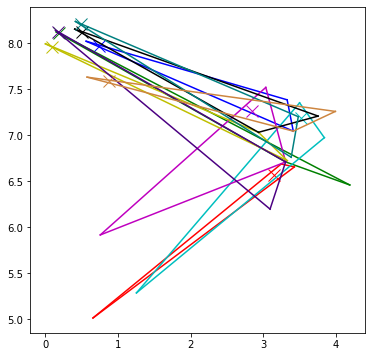

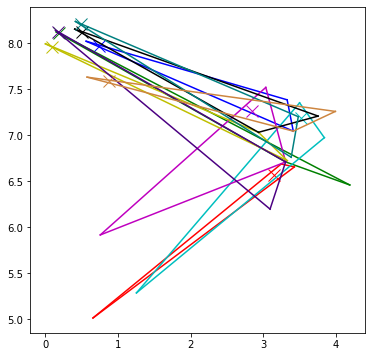

In [25]:
criterion = nn.CrossEntropyLoss()
optimizer_where = optim.SGD(where.parameters(), lr=0.01, momentum=0.9)
optimizer_what = optim.SGD(what.parameters(), lr=0.01, momentum=0.9)




nos_epochs = 300

train_loss=[]

train_acc = [] 
ig = np.random.randint(0,250)
for epoch in range(nos_epochs):  # loop over the dataset multiple times
    avg11_inp = []
    avg11_label = [] 
    running_loss = 0.0
    running_acc = 0
    cnt=0
    c = 0
    iteration = desired_num // batch
    
    for i, data in  enumerate(train_loader):
        inputs , labels , fore_idx = data
        
        optimizer_what.zero_grad()
        optimizer_where.zero_grad()
        
        avg_inp,alphas = where(inputs)
        outputs = what(avg_inp)
        
        _, predicted = torch.max(outputs.data, 1)
        
        avg11_inp.append(avg_inp)
        avg11_label.append(labels)
        if(c==0):
           
            disp_plot(inputs[:10,:],avg_inp[:10],labels[:10].numpy()
                      ,predicted[:10].numpy(), avg_inp[:10,:], fore_idx[:10].numpy())
            c+=1
            
        loss = criterion(outputs, labels) 
        loss.backward() 
        
        optimizer_what.step()
        optimizer_where.step() 
        

        running_loss += loss.item()
        running_acc+=sum(predicted.cpu().numpy()== labels.cpu().numpy())
        
        if cnt % 4 == 3:    # print every 6 mini-batches
            print('[%d, %5d] loss: %.3f' %(epoch + 1, cnt + 1, running_loss/4 ))
            print('[%d,%5d] accuracy: %.3f' %(epoch + 1, cnt+1,running_acc/1000))
            
            train_loss.append(running_loss)
            train_acc.append(running_acc /1000)
            running_loss = 0.0
            running_acc = 0
            
            torch.save(where.state_dict(),"weight_elemental_2/where_model_epoch"+str(epoch)+".pt")
            torch.save(what.state_dict(),"weight_elemental_2/what_model_epoch"+str(epoch)+".pt")
        cnt=cnt+1
        
print('Finished Training')
torch.save(where.state_dict(),"weight_elemental_2/where_model_epoch"+str(nos_epochs)+".pt")
torch.save(what.state_dict(),"weight_elemental_2/what_model_epoch"+str(epoch)+".pt")       
        
        
        

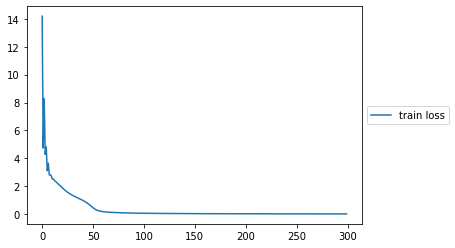

In [26]:
plt.plot(train_loss,label = "train loss")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

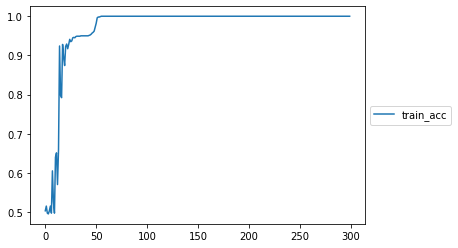

In [27]:
plt.plot(train_acc,label ="train_acc")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))